# Starting a Restaurant in New York City

## Background
As a part of the IBM Data Science course on Coursera, I did a number of small projects that introduced me to the field of work a data scientist gets involved in. I worked on real datasets, which included school data for schools in Chicago, crime data in San Francisco, value of cars etc. The main objectives for this project is to solve a business problem, look for supporting data on the internet and, use Foursquare location data to compare different neighborhoods (of in this case New York City) to figure out which neighborhood is suitable for starting a new restaurant. In Jupyter notebook, we will go through my methodology from problem designing, data preparation to final analysis and finally will provide a conclusion that will help me make a decision on where to start my restaurant. 

## Defining the Opportunity:
New York City, NY, USA is undoubtedly one of the (if not the) most iconic cities in the world. As Frank Sinatra once sung: **If I can make it here, I'll make it anywhere**. Therefore, we have identified the city that never sleeps is the ideal place to open a new coffeeshop. An entrepreneur that has reached out to us, brews a great cup of coffee and therefore wants to start a little coffee corner shop somewhere in New York City. He wants to start a coffee shop in a nice busy neighbourhood close to a subway station so he can serve people on the go. Millions of people use the subway each day, so capturing the people on the go and serving them (good) coffee is a great opportunity.  



# 1. Importing the right Software Packages
Before we can get started with the analysis we need to dowload and install all the relevant software packages.\
This is an important part of the exercise, and takes a little while, so feel free to skip to the next step.

In [ ]:
import numpy as np 
import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json 
#!conda install -c conda-forge geopy --yes 
!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
# import k-means from clustering stage
from sklearn.cluster import KMeans
!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
print("")
print("Libraries downloaded and installed")

Solving environment: / 

## 2. Downloading all the relevant data:
To get started, I will download data which will help me to identify which neighbourhood is the most suitable to start my bakery/coffee shop.

First up is the data of the different boroughs and neigborhoods of New York City

In [69]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)
    print('Data downloaded!')

Data downloaded!


Next we will transform the Data into a Dataframe

In [70]:
neighborhoods_data = newyork_data['features']

column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]    ))

neighborhoods.head()

The dataframe has 5 boroughs and 306 neighborhoods.


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


The next step is to analyse the population of New York City, we would like to start our coffeeshop in the busiest borough

In [71]:
url_data = 'https://en.wikipedia.org/wiki/Template:NYC_boroughs'
Population = pd.read_html(url_data,header = 2)[0]
Population.columns=["Borough","County","Population","GDP","GBP per Capita","sqm","sqkm","p/sqm","p/sqkm"]
Population = Population[:-3]
Population['Population'] = Population['Population'].astype(int)
print ("The borough with the highest population is:", Population.loc[Population.Population.idxmax(), 'Borough'])
Population.head()

The borough with the highest population is: Brooklyn


,Borough,County,Population,GDP,GBP per Capita,sqm,sqkm,p/sqm,p/sqkm
0,The Bronx,Bronx,1418207,42.695,30100,42.10,109.04,33867,13006
1,Brooklyn,Kings,2559903,91.559,35800,70.82,183.42,36147,13957
2,Manhattan,New York,1628706,600.244,368500,22.83,59.13,71341,27544
3,Queens,Queens,2253858,93.310,41400,108.53,281.09,20767,8018
4,Staten Island,Richmond,476143,14.514,30500,58.37,151.18,8157,3150


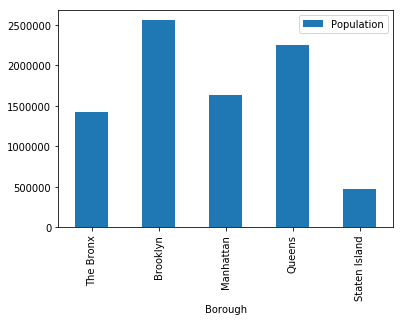

In [72]:
ax = Population.plot.bar(x='Borough',y='Population')

In [3]:
url_subway = 'http://web.mta.info/developers/data/nyct/subway/Stations.csv'
subway = pd.read_csv(url_subway)
subway_p_borough = subway.groupby('Borough')['Station ID'].nunique()
pd.DataFrame(subway_p_borough)

NameError: name 'pd' is not defined

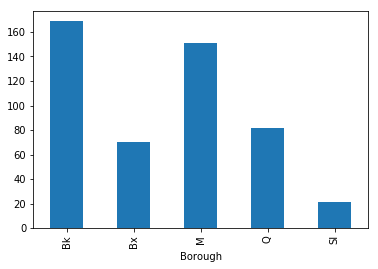

In [74]:
ax = subway_p_borough.plot.bar(x='Borough',y='Station ID')

#### We have identified that Brooklyn has the highest population and the most subway stations, this would be a great location to open up a coffee shop!
#### Now that we have the found out that we want to open a coffee shop in Brooklyn we can prepare our dataset

In [75]:
Brooklyn_data = neighborhoods[neighborhoods['Borough'] == 'Brooklyn'].reset_index(drop=True)
print(Brooklyn_data.shape)
Brooklyn_data.head()

(70, 4)


,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621
1,Brooklyn,Bensonhurst,40.611009,-73.995180
2,Brooklyn,Sunset Park,40.645103,-74.010316
3,Brooklyn,Greenpoint,40.730201,-73.954241
4,Brooklyn,Gravesend,40.595260,-73.973471


In [76]:
Brooklyn_Subways = subway[subway['Borough']=='Bk'].reset_index(drop=True)
Brooklyn_Subways.head()

,Station ID,Complex ID,GTFS Stop ID,Division,Line,Stop Name,Borough,Daytime Routes,Structure,GTFS Latitude,GTFS Longitude,North Direction Label,South Direction Label
0,24,620,R28,BMT,Broadway,Court St,Bk,R,Subway,40.694100,-73.991777,Manhattan,Bay Ridge - 95 St
1,25,636,R29,BMT,Broadway,Jay St - MetroTech,Bk,R,Subway,40.692180,-73.985942,Manhattan,Bay Ridge - 95 St
2,26,26,R30,BMT,Broadway - Brighton,DeKalb Av,Bk,B Q R,Subway,40.690635,-73.981824,Manhattan,Coney Island - Bay Ridge
3,27,617,R31,BMT,4th Av,Atlantic Av - Barclays Ctr,Bk,D N R,Subway,40.683666,-73.978810,Manhattan,Coney Island - Bay Ridge
4,28,28,R32,BMT,4th Av,Union St,Bk,R,Subway,40.677316,-73.983110,Manhattan,Bay Ridge - 95 St


We can now determine which neighbourhoods have a subway station in Brooklyn. We do this by determinining the closest Neighborhood coordinate to each subway station.

In [2]:
from scipy.spatial.distance import cdist

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]

def match_value(df, col1, x, col2):
    """ Match value x from col1 row to value in col2. """
    return df[df[col1] == x][col2].values[0]

Brooklyn_data['point'] = [(x, y) for x,y in zip(Brooklyn_data['Latitude'], Brooklyn_data['Longitude'])]
Brooklyn_Subways['point'] = [(x, y) for x,y in zip(Brooklyn_Subways['GTFS Latitude'], Brooklyn_Subways['GTFS Longitude'])]

Brooklyn_Subways['closest'] = [closest_point(x, list(Brooklyn_data['point'])) for x in Brooklyn_Subways['point']]
Brooklyn_Subways['Neighbourhood'] = [match_value(Brooklyn_data, 'point', x, 'Neighborhood') for x in Brooklyn_Subways['closest']]

Brooklyn_Subways.head()

NameError: name 'Brooklyn_data' is not defined

In [1]:
Most_Stations = Brooklyn_Subways.groupby('Nieghbourhood')['Station ID'].nunique()

NameError: name 'Brooklyn_Subways' is not defined

In [78]:
Brooklyn_Data_Stations = Brooklyn_Subways.Neighbourhood.unique()
Brooklyn_Data_Stations = pd.DataFrame(Brooklyn_Data_Stations)
Brooklyn_Data_Stations.columns = ["Neighbourhood"]
Brooklyn_Data_Stations.head()

,Neighbourhood
0,Brooklyn Heights
1,Downtown
2,Boerum Hill
3,Park Slope
4,Gowanus


In [79]:
duplicates = set(Brooklyn_data.Neighborhood).intersection(Brooklyn_Data_Stations.Neighbourhood)
duplicates = np.array(duplicates).tolist()
Brooklyn_data_dropped = Brooklyn_data[~Brooklyn_data['Neighborhood'].isin(duplicates)]
Brooklyn_data = Brooklyn_data[Brooklyn_data['Neighborhood'].isin(duplicates)]

# 3. Translate the data of the neighborhoods onto a map
Now that we have a dataframe which includes all the **boroughs** and **neighborhoods** in New York, we can start plotting the information on a map. Although we wont select a borough or neighborhood at this stage the map will give us an overview of where the different neighborhoods are. At a later stage this map will be updated and will help us to identify the best neighborhoods for us to open our restaurant in.\
\
First we will select New York as a whole, by feeding the address **New York City, NY** to our coding. The geolocator will define the right coordinates for New York and draw the map for us.

In [80]:
address = 'Brooklyn, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Brooklyn are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Brooklyn are 40.6501038, -73.9495823.


In [81]:
map_brooklyn = folium.Map(location=[latitude, longitude], zoom_start=12)
for lat, lng, borough, neighborhood in zip(Brooklyn_data['Latitude'], Brooklyn_data['Longitude'], Brooklyn_data['Borough'], Brooklyn_data['Neighborhood']):
    label = '{}, {}'.format(Brooklyn_data, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_brooklyn)  
for lat, lng, borough, line in zip(Brooklyn_Subways['GTFS Latitude'], Brooklyn_Subways['GTFS Longitude'], Brooklyn_Subways['Borough'], Brooklyn_Subways['Daytime Routes']):
    label = '{}, {}'.format(Brooklyn_Subways, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_brooklyn) 
for lat, lng, borough, neighborhood in zip(Brooklyn_data_dropped['Latitude'], Brooklyn_data_dropped['Longitude'], Brooklyn_data_dropped['Borough'], Brooklyn_data_dropped['Neighborhood']):
    label = '{}, {}'.format(Brooklyn_data_dropped, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='white',
        fill_opacity=0.7,
        parse_html=False).add_to(map_brooklyn)  

### The map is currently not displayed below, if you want to see the map please run the line of code below

In [82]:
map_brooklyn

# 4. Finding existing coffeeshop using foursquare

Set Foursquare log-in

In [83]:
CLIENT_ID = 'BUWXO01QS1KDEESIV5LQWIVMTSDYMQXSMHY3T1404BO0PH1K' # your Foursquare ID
CLIENT_SECRET = 'BF0DAM3XEC1FRNXRXMHFZBVW4YHDAWJOQEYHVMCDGYBKGFEN' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: BUWXO01QS1KDEESIV5LQWIVMTSDYMQXSMHY3T1404BO0PH1K
CLIENT_SECRET:BF0DAM3XEC1FRNXRXMHFZBVW4YHDAWJOQEYHVMCDGYBKGFEN


In [136]:
LIMIT = 100
radius = 750
# CategoryID's
categoryID ='5e18993feee47d000759b256' #CoffeeRoaster as Dummy
BagelShop =       '4bf58dd8d48988d179941735'
Bakery =          '4bf58dd8d48988d16a941735'
BreakfastSpot =   '4bf58dd8d48988d143941735'
Cafe =            '4bf58dd8d48988d16d941735'
CoffeeShop =      '4bf58dd8d48988d1e0931735'
Donut =           '4bf58dd8d48988d148941735'
FastFood =        '4bf58dd8d48988d16e941735'
FoodCourt =       '4bf58dd8d48988d120951735'
FoodStand =       '56aa371be4b08b9a8d57350b'
FoodTruck =       '4bf58dd8d48988d1cb941735'
Juice =           '4bf58dd8d48988d112941735'
Market =          '50be8ee891d4fa8dcc7199a7'
Salads =          '4bf58dd8d48988d1bd941735'
Sandwich =        '4bf58dd8d48988d1c5941735'
Snacks =          '4bf58dd8d48988d1c7941735'
Tea =             '4bf58dd8d48988d1dc931735'

In [134]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,categoryID)
        results = requests.get(url).json()["response"]['groups'][0]['items']
        venues_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in results])

        
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [135]:
Brooklyn_Venues = getNearbyVenues(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [86]:
def getNearbyBagelShop(names, latitudes, longitudes, radius=500):
    
    BagelShop_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        BagelShopURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,BagelShop)
        BagelShopResults = requests.get(BagelShopURL).json()["response"]['groups'][0]['items']
        BagelShop_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in BagelShopResults])


        
    nearby_BagelShop = pd.DataFrame([item for BagelShop_list in BagelShop_list for item in BagelShop_list])
    nearby_BagelShop.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_BagelShop)

In [105]:
Brooklyn_BagelShop = getNearbyBagelShop(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [137]:
def getNearbyBakery(names, latitudes, longitudes, radius=500):
    
    Bakery_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        BakeryURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Bakery)
        BakeryResults = requests.get(BakeryURL).json()["response"]['groups'][0]['items']
        Bakery_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in BakeryResults])


        
    nearby_Bakery = pd.DataFrame([item for Bakery_list in Bakery_list for item in Bakery_list])
    nearby_Bakery.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Bakery)

In [138]:
Brooklyn_Bakery = getNearbyBakery(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights


IndexError: list index out of range

In [88]:
def getNearbyBreakfastSpot(names, latitudes, longitudes, radius=500):
    
    BreakfastSpot_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        BreakfastSpotURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,BreakfastSpot)
        BreakfastSpotResults = requests.get(BreakfastSpotURL).json()["response"]['groups'][0]['items']
        BreakfastSpot_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in BreakfastSpotResults])


        
    nearby_BreakfastSpot = pd.DataFrame([item for BreakfastSpot_list in BreakfastSpot_list for item in BreakfastSpot_list])
    nearby_BreakfastSpot.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_BreakfastSpot)

In [107]:
Brooklyn_BreakfastSpot = getNearbyBreakfastSpot(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [127]:
def getNearbyCafe(names, latitudes, longitudes, radius=500):
    
    Cafe_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        CafeURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Cafe)
        CafeResults = requests.get(CafeURL).json()["response"]['groups'][0]['items']
        Cafe_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in CafeResults])


        
    nearby_Cafe = pd.DataFrame([item for Cafe_list in Cafe_list for item in Cafe_list])
    nearby_Cafe.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Cafe)

In [128]:
Brooklyn_Cafe = getNearbyCafe(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst


IndexError: list index out of range

In [90]:
def getNearbyDonut(names, latitudes, longitudes, radius=500):
    
    Donut_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        DonutURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Donut)
        DonutResults = requests.get(DonutURL).json()["response"]['groups'][0]['items']
        Donut_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in DonutResults])


        
    nearby_Donut = pd.DataFrame([item for Donut_list in Donut_list for item in Donut_list])
    nearby_Donut.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Donut)

In [110]:
Brooklyn_Donut = getNearbyDonut(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [91]:
def getNearbyFastFood(names, latitudes, longitudes, radius=500):
    
    FastFood_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        FastFoodURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,FastFood)
        FastFoodResults = requests.get(FastFoodURL).json()["response"]['groups'][0]['items']
        FastFood_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in FastFoodResults])


        
    nearby_FastFood = pd.DataFrame([item for FastFood_list in FastFood_list for item in FastFood_list])
    nearby_FastFood.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_FastFood)

In [111]:
Brooklyn_FastFood = getNearbyFastFood(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [92]:
def getNearbyCoffeeShop(names, latitudes, longitudes, radius=500):
    
    CoffeeShop_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        CoffeeShopURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,CoffeeShop)
        CoffeeShopResults = requests.get(CoffeeShopURL).json()["response"]['groups'][0]['items']
        CoffeeShop_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in CoffeeShopResults])


        
    nearby_CoffeeShop = pd.DataFrame([item for CoffeeShop_list in CoffeeShop_list for item in CoffeeShop_list])
    nearby_CoffeeShop.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_CoffeeShop)


In [112]:
Brooklyn_CoffeeShop = getNearbyCoffeeShop(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [93]:
def getNearbyFoodCourt(names, latitudes, longitudes, radius=500):
    
    FoodCourt_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        FoodCourtURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,FoodCourt)
        FoodCourtResults = requests.get(FoodCourtURL).json()["response"]['groups'][0]['items']
        FoodCourt_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in FoodCourtResults])


        
    nearby_FoodCourt = pd.DataFrame([item for FoodCourt_list in FoodCourt_list for item in FoodCourt_list])
    nearby_FoodCourt.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_FoodCourt)


In [113]:
Brooklyn_FoodCourt= getNearbyFoodCourt(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                  longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [94]:
def getNearbyFoodStand(names, latitudes, longitudes, radius=500):
    
    FoodStand_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        FoodStandURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,FoodStand)
        FoodStandResults = requests.get(FoodStandURL).json()["response"]['groups'][0]['items']
        FoodStand_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in FoodStandResults])


        
    nearby_FoodStand = pd.DataFrame([item for FoodStand_list in FoodStand_list for item in FoodStand_list])
    nearby_FoodStand.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_FoodStand)

In [114]:
Brooklyn_FoodStand= getNearbyFoodStand(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [95]:
def getNearbyFoodTruck(names, latitudes, longitudes, radius=500):
    
    FoodTruck_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        FoodTruckURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,FoodTruck)
        FoodTruckResults = requests.get(FoodTruckURL).json()["response"]['groups'][0]['items']
        FoodTruck_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in FoodTruckResults])


        
    nearby_FoodTruck = pd.DataFrame([item for FoodTruck_list in FoodTruck_list for item in FoodTruck_list])
    nearby_FoodTruck.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_FoodTruck)

In [115]:
Brooklyn_FoodTruck= getNearbyFoodTruck(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [96]:
def getNearbyJuice(names, latitudes, longitudes, radius=500):
    
    Juice_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        JuiceURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Juice)
        JuiceResults = requests.get(JuiceURL).json()["response"]['groups'][0]['items']
        Juice_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in JuiceResults])


        
    nearby_Juice = pd.DataFrame([item for Juice_list in Juice_list for item in Juice_list])
    nearby_Juice.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Juice)

In [116]:
Brooklyn_Juice = getNearbyJuice(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [131]:
def getNearbyMarket(names, latitudes, longitudes, radius=500):
    
    Market_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        MarketURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Market)
        MarketResults = requests.get(MarketURL).json()["response"]['groups'][0]['items']
        Market_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in MarketResults])


        
    nearby_Market = pd.DataFrame([item for Market_list in Market_list for item in Market_list])
    nearby_Market.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Market)

In [132]:
Brooklyn_Market = getNearbyMarket(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach


IndexError: list index out of range

In [98]:
def getNearbySalads(names, latitudes, longitudes, radius=500):
    
    Salads_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        SaladsURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Salads)
        SaladsResults = requests.get(SaladsURL).json()["response"]['groups'][0]['items']
        Salads_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in SaladsResults])


        
    nearby_Salads = pd.DataFrame([item for Salads_list in Salads_list for item in Salads_list])
    nearby_Salads.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Salads)

In [118]:
Brooklyn_Salads = getNearbySalads(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [99]:
def getNearbySandwich(names, latitudes, longitudes, radius=500):
    
    Sandwich_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        SandwichURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Sandwich)
        SandwichResults = requests.get(SandwichURL).json()["response"]['groups'][0]['items']
        Sandwich_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in SandwichResults])


        
    nearby_Sandwich = pd.DataFrame([item for Sandwich_list in Sandwich_list for item in Sandwich_list])
    nearby_Sandwich.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Sandwich)

In [119]:
Brooklyn_Sandwich = getNearbySandwich(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [100]:
def getNearbySnacks(names, latitudes, longitudes, radius=500):
    
    Snacks_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        SnacksURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Snacks)
        SnacksResults = requests.get(SnacksURL).json()["response"]['groups'][0]['items']
        Snacks_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in SnacksResults])


        
    nearby_Snacks = pd.DataFrame([item for Snacks_list in Snacks_list for item in Snacks_list])
    nearby_Snacks.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Snacks)

In [120]:
Brooklyn_Snacks = getNearbySnacks(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [101]:
def getNearbyTea(names, latitudes, longitudes, radius=500):
    
    Tea_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL    
        # make the GET request
        # return only relevant information for each nearby venue
        TeaURL = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}&intent=browse'.format(
            CLIENT_ID,CLIENT_SECRET,VERSION,lat,lng,radius,LIMIT,Tea)
        TeaResults = requests.get(TeaURL).json()["response"]['groups'][0]['items']
        Tea_list.append([(name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in TeaResults])


        
    nearby_Tea = pd.DataFrame([item for Tea_list in Tea_list for item in Tea_list])
    nearby_Tea.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_Tea)

In [121]:
Brooklyn_Tea = getNearbyTea(names=Brooklyn_data['Neighborhood'],
                                   latitudes=Brooklyn_data['Latitude'],
                                   longitudes=Brooklyn_data['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Carroll Gardens
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Canarsie
Coney Island
Bath Beach
Borough Park
Clinton Hill
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Midwood
Prospect Park South
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Rugby
New Lots
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Erasmus


In [140]:
print("Brooklyn Venues:", Brooklyn_Venues.shape)
print("Bagelshop:", Brooklyn_BagelShop.shape)
#print("Bakeries:", Brooklyn_Bakery.shape)
print("Breakfast Spots:", Brooklyn_BreakfastSpot.shape)
#print("Cafes:", Brooklyn_Cafe.shape)
print("Coffeeshops:", Brooklyn_CoffeeShop.shape)
print("Donuts:", Brooklyn_Donut.shape)
print("Fastfood:", Brooklyn_FastFood.shape)
print("Food Court:", Brooklyn_FoodCourt.shape)
print("Food Stand:", Brooklyn_FoodStand.shape)
print("Food Truck:", Brooklyn_FoodTruck.shape)
print("Juice:", Brooklyn_Juice.shape)
#print("Market:", Brooklyn_Market.shape)
print("Salads:", Brooklyn_Salads.shape)
print("Sandwich:", Brooklyn_Sandwich.shape)
print("Snacks:", Brooklyn_Snacks.shape)
print("Tea:", Brooklyn_Tea.shape)

Brooklyn Venues: (9, 7)
Bagelshop: (150, 7)
Breakfast Spots: (1306, 7)
Coffeeshops: (351, 7)
Donuts: (106, 7)
Fastfood: (166, 7)
Food Court: (21, 7)
Food Stand: (32, 7)
Food Truck: (192, 7)
Juice: (81, 7)
Salads: (348, 7)
Sandwich: (300, 7)
Snacks: (113, 7)
Tea: (32, 7)


In [142]:
AllVenues = [Brooklyn_Venues, Brooklyn_BagelShop, Brooklyn_BreakfastSpot, Brooklyn_CoffeeShop, Brooklyn_Donut, Brooklyn_FastFood, Brooklyn_Juice, Brooklyn_Salads, Brooklyn_Sandwich, Brooklyn_Snacks, Brooklyn_Tea, Brooklyn_FoodCourt, Brooklyn_FoodStand, Brooklyn_FoodTruck]
# Brooklyn_FoodCourt, Brooklyn_FoodStand, Brooklyn_FoodTruck, Brooklyn_Market,
# Brooklyn_Bakery, Brooklyn_Cafe, Brooklyn_Market
Brooklyn_venues = pd.concat(AllVenues)
print("Brooklyn Venues after combining:", Brooklyn_venues.shape)

Brooklyn Venues after combining: (3207, 7)


In [143]:
Brooklyn_venues.drop_duplicates(keep=False,inplace=True)
print("Brooklyn Venues after deleting duplicates:", Brooklyn_venues.shape)

Brooklyn Venues after deleting duplicates: (1668, 7)


In [144]:
print(Brooklyn_venues.shape)
Brooklyn_venues.head()

(1668, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
2,Clinton Hill,40.693229,-73.967843,Shared Roasting,40.697323,-73.967278,Coffee Roaster
9,Sunset Park,40.645103,-74.010316,Munchy Donuts,40.643040,-74.012554,Bagel Shop
17,Gravesend,40.595260,-73.973471,Avenue U Bagel,40.596802,-73.973650,Bagel Shop
24,Manhattan Terrace,40.614433,-73.957438,Chock Full O' Nuts,40.618160,-73.958746,Bagel Shop
37,Prospect Heights,40.676822,-73.964859,Blue Marble,40.674993,-73.966897,Ice Cream Shop


In [170]:
Brooklyn_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bath Beach,21,21,21,21,21,21
Bay Ridge,24,24,24,24,24,24
Bedford Stuyvesant,17,17,17,17,17,17
Bensonhurst,19,19,19,19,19,19
Boerum Hill,80,80,80,80,80,80
Borough Park,17,17,17,17,17,17
Brighton Beach,35,35,35,35,35,35
Broadway Junction,19,19,19,19,19,19
Brooklyn Heights,54,54,54,54,54,54


In [168]:
print('There are {} uniques categories.'.format(len(Brooklyn_venues['Venue Category'].unique())))

There are 111 uniques categories.


In [171]:
# one hot encoding
Brooklyn_onehot = pd.get_dummies(Brooklyn_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Brooklyn_onehot['Neighborhood'] = Brooklyn_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [Brooklyn_onehot.columns[-1]] + list(Brooklyn_onehot.columns[:-1])
Brooklyn_onehot = Brooklyn_onehot[fixed_columns]

col_name="Neighborhood"
first_col = Brooklyn_onehot.pop(col_name)
Brooklyn_onehot.insert(0, col_name, first_col)

print(Brooklyn_onehot.shape)
Brooklyn_onehot.head()

TypeError: 'Index' object is not callable

In [154]:
Columns =['Accessories Store','American Restaurant','Asian Restaurant','BBQ Joint','Bar','Beer Garden','Beer Store','Bike Shop','Bistro','Brazilian Restaurant',\
          'Bubble Tea Shop','Buffet','Burger Joint','Burmese Restaurant','Burrito Place','Butcher','Candy Store','Cantonese Restaurant','Caribbean Restaurant',\
          'Caucasian Restaurant','Chinese Restaurant','Cocktail Bar','Convenience Store','Coworking Space','Creperie','Cuban Restaurant','Deli / Bodega',\
          'Dessert Shop','Dim Sum Restaurant','Diner','Dive Bar','Dumpling Restaurant','Eastern European Restaurant','Event Space','Factory','Falafel Restaurant',\
          'Farmers Market','Food','Food & Drink Shop','French Restaurant','Fried Chicken Joint','Fruit & Vegetable Store','Gas Station','Gastropub','German Restaurant',\
          'Grocery Store','Halal Restaurant','Health Food Store','Hookah Bar','Hot Dog Joint','Hotpot Restaurant','Ice Cream Shop','Indian Restaurant','Indian Sweet Shop',\
          'Italian Restaurant','Japanese Restaurant','Korean Restaurant','Kosher Restaurant','Latin American Restaurant','Lounge','Mediterranean Restaurant','Mexican Restaurant',\
          'Middle Eastern Restaurant','Music Venue','New American Restaurant','Noodle House','Pakistani Restaurant','Pie Shop','Pizza Place','Polish Restaurant','Pub',\
          'Ramen Restaurant','Record Shop','Residential Building (Apartment / Condo)','Restaurant','Russian Restaurant','Seafood Restaurant','Soup Place','South American Restaurant',\
          'Southern / Soul Food Restaurant','Spanish Restaurant','Steakhouse','Sushi Restaurant','Taco Place','Tapas Restaurant','Thai Restaurant','Turkish Restaurant','Vegetarian / Vegan Restaurant',\
          'Vietnamese Restaurant','Whisky Bar','Wine Bar','Wine Shop','Wings Joint','Yoga Studio']

In [173]:
Brooklyn_onehot.drop(Columns, axis = 1, inplace = True)
Brooklyn_onehot.shape

(1668, 19)

In [207]:
Brooklyn_onehot['Total'] = Brooklyn_onehot.sum(axis=1)
print( Brooklyn_onehot.shape)
Brooklyn_onehot.head(5)

(808, 19)


,Bagel Shop,Bakery,Breakfast Spot,Café,Coffee Roaster,Coffee Shop,Donut Shop,Fast Food Restaurant,Food Court,Food Stand,Food Truck,Juice Bar,Newsstand,Salad Place,Sandwich Place,Snack Place,Tea Room,Neighborhood,Total
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Clinton Hill,1
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Sunset Park,1
17,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Gravesend,1
24,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Manhattan Terrace,1
44,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Prospect Heights,1


In [210]:
Brooklyn_onehot = Brooklyn_onehot[Brooklyn_onehot.Total != 0]
print( Brooklyn_onehot.shape)
Brooklyn_onehot.drop(['Total'], axis = 1, inplace = True)
print( Brooklyn_onehot.shape)
Brooklyn_onehot.head(5)

(808, 19)
(808, 18)


,Bagel Shop,Bakery,Breakfast Spot,Café,Coffee Roaster,Coffee Shop,Donut Shop,Fast Food Restaurant,Food Court,Food Stand,Food Truck,Juice Bar,Newsstand,Salad Place,Sandwich Place,Snack Place,Tea Room,Neighborhood
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Clinton Hill
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Sunset Park
17,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Gravesend
24,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Manhattan Terrace
44,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Prospect Heights


In [211]:
Brooklyn_onehot.shape

(808, 18)

In [212]:
Brooklyn_grouped = Brooklyn_onehot.groupby('Neighborhood').mean().reset_index()
print(Brooklyn_grouped.shape)
Brooklyn_grouped

(49, 18)


,Neighborhood,Bagel Shop,Bakery,Breakfast Spot,Café,Coffee Roaster,Coffee Shop,Donut Shop,Fast Food Restaurant,Food Court,Food Stand,Food Truck,Juice Bar,Newsstand,Salad Place,Sandwich Place,Snack Place,Tea Room
0,Bath Beach,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.285714,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.428571,0.000000,0.000000
1,Bay Ridge,0.000000,0.181818,0.000000,0.090909,0.000000,0.181818,0.000000,0.181818,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.272727,0.090909,0.000000
2,Bedford Stuyvesant,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.111111,0.000000,0.000000,0.222222,0.111111,0.000000,0.000000,0.222222,0.000000,0.000000
3,Bensonhurst,0.000000,0.181818,0.090909,0.181818,0.000000,0.181818,0.181818,0.090909,0.000000,0.000000,0.090909,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Boerum Hill,0.071429,0.023810,0.142857,0.023810,0.000000,0.047619,0.023810,0.142857,0.023810,0.047619,0.166667,0.071429,0.000000,0.023810,0.190476,0.000000,0.000000
5,Borough Park,0.230769,0.230769,0.153846,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.076923,0.076923,0.076923,0.000000
6,Brighton Beach,0.000000,0.200000,0.066667,0.000000,0.000000,0.133333,0.066667,0.200000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.066667,0.066667,0.000000
7,Broadway Junction,0.000000,0.000000,0.111111,0.000000,0.000000,0.333333,0.000000,0.222222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.111111,0.000000
8,Brooklyn Heights,0.000000,0.103448,0.000000,0.137931,0.000000,0.034483,0.000000,0.137931,0.034483,0.000000,0.310345,0.000000,0.000000,0.034483,0.137931,0.034483,0.034483
9,Brownsville,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.250000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000


In [214]:
num_top_venues = 5

for hood in Brooklyn_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Brooklyn_grouped[Brooklyn_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bath Beach----
                  venue  freq
0        Sandwich Place  0.43
1  Fast Food Restaurant  0.29
2             Juice Bar  0.14
3                Bakery  0.14
4            Bagel Shop  0.00


----Bay Ridge----
                  venue  freq
0        Sandwich Place  0.27
1           Coffee Shop  0.18
2  Fast Food Restaurant  0.18
3                Bakery  0.18
4           Snack Place  0.09


----Bedford Stuyvesant----
                  venue  freq
0           Coffee Shop  0.33
1            Food Truck  0.22
2        Sandwich Place  0.22
3  Fast Food Restaurant  0.11
4             Juice Bar  0.11


----Bensonhurst----
            venue  freq
0            Café  0.18
1     Coffee Shop  0.18
2      Donut Shop  0.18
3          Bakery  0.18
4  Breakfast Spot  0.09


----Boerum Hill----
                  venue  freq
0        Sandwich Place  0.19
1            Food Truck  0.17
2        Breakfast Spot  0.14
3  Fast Food Restaurant  0.14
4            Bagel Shop  0.07


----Borough Park----
 

                  venue  freq
0                Bakery  0.26
1            Food Truck  0.26
2  Fast Food Restaurant  0.15
3                  Café  0.07
4           Coffee Shop  0.07


----Weeksville----
            venue  freq
0          Bakery  0.50
1  Sandwich Place  0.25
2     Coffee Shop  0.25
3      Bagel Shop  0.00
4      Food Truck  0.00


----Williamsburg----
                  venue  freq
0            Food Truck  0.27
1  Fast Food Restaurant  0.20
2              Tea Room  0.13
3        Sandwich Place  0.07
4             Juice Bar  0.07


----Windsor Terrace----
            venue  freq
0  Breakfast Spot  0.22
1  Sandwich Place  0.22
2      Food Truck  0.11
3     Salad Place  0.11
4      Donut Shop  0.11




In [215]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

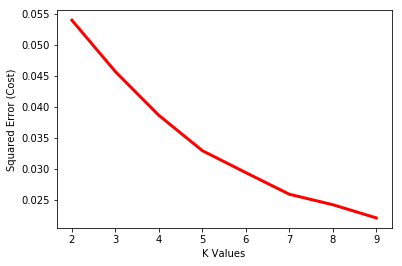

In [233]:
Brooklyn_part_clustering = Brooklyn_grouped.drop('Neighborhood', 1)
error_cost = []
for i in range (2,10):
        KM = KMeans(n_clusters = i, max_iter = 100)
        try:
            KM.fit(Brooklyn_part_clustering)
        except:
            print("error on line:", i)
        
        error_cost.append(KM.inertia_/100)
    
plt.plot(range(2,10), error_cost, color = 'r', linewidth = '3')
plt.xlabel('K Values')
plt.ylabel('Squared Error (Cost)')
plt.show()

In [268]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Brooklyn_grouped['Neighborhood']

for ind in np.arange(Brooklyn_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Brooklyn_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bath Beach,Sandwich Place,Fast Food Restaurant,Bakery,Juice Bar,Tea Room
1,Bay Ridge,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Café
2,Bedford Stuyvesant,Coffee Shop,Sandwich Place,Food Truck,Juice Bar,Fast Food Restaurant
3,Bensonhurst,Bakery,Café,Coffee Shop,Donut Shop,Fast Food Restaurant
4,Boerum Hill,Sandwich Place,Food Truck,Breakfast Spot,Fast Food Restaurant,Bagel Shop


In [269]:
kclusters = 5

Brooklyn_clustering = Brooklyn_grouped.drop('Neighborhood', 1)

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Brooklyn_clustering)

kmeans.labels_[0:10] 

array([1, 1, 1, 4, 1, 4, 0, 1, 0, 1], dtype=int32)

In [270]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Brooklyn_merged = Brooklyn_data


Brooklyn_merged = Brooklyn_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Brooklyn_merged.head() 

,Borough,Neighborhood,Latitude,Longitude,point,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,"(40.625801065010656, -74.03062069353813)",1.0,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Café
1,Brooklyn,Bensonhurst,40.611009,-73.995180,"(40.61100890202044, -73.99517998380729)",4.0,Bakery,Café,Coffee Shop,Donut Shop,Fast Food Restaurant
2,Brooklyn,Sunset Park,40.645103,-74.010316,"(40.64510294925429, -74.01031618527784)",0.0,Bakery,Food Truck,Fast Food Restaurant,Café,Coffee Shop
3,Brooklyn,Greenpoint,40.730201,-73.954241,"(40.7302009848647, -73.95424093127393)",0.0,Sandwich Place,Food Truck,Fast Food Restaurant,Bakery,Juice Bar
4,Brooklyn,Gravesend,40.595260,-73.973471,"(40.59526001306593, -73.97347087708445)",4.0,Bakery,Café,Bagel Shop,Fast Food Restaurant,Breakfast Spot


In [271]:
Brooklyn_merged = Brooklyn_merged.dropna()
Brooklyn_merged = Brooklyn_merged.drop('point', 1)
Brooklyn_merged.head(10)

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,1.0,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Café
1,Brooklyn,Bensonhurst,40.611009,-73.995180,4.0,Bakery,Café,Coffee Shop,Donut Shop,Fast Food Restaurant
2,Brooklyn,Sunset Park,40.645103,-74.010316,0.0,Bakery,Food Truck,Fast Food Restaurant,Café,Coffee Shop
3,Brooklyn,Greenpoint,40.730201,-73.954241,0.0,Sandwich Place,Food Truck,Fast Food Restaurant,Bakery,Juice Bar
4,Brooklyn,Gravesend,40.595260,-73.973471,4.0,Bakery,Café,Bagel Shop,Fast Food Restaurant,Breakfast Spot
5,Brooklyn,Brighton Beach,40.576825,-73.965094,0.0,Bakery,Food Truck,Fast Food Restaurant,Coffee Shop,Sandwich Place
6,Brooklyn,Sheepshead Bay,40.586890,-73.943186,1.0,Sandwich Place,Fast Food Restaurant,Café,Food Truck,Tea Room
7,Brooklyn,Manhattan Terrace,40.614433,-73.957438,4.0,Bakery,Café,Bagel Shop,Fast Food Restaurant,Juice Bar
8,Brooklyn,Flatbush,40.636326,-73.958401,4.0,Bakery,Fast Food Restaurant,Food Truck,Coffee Shop,Breakfast Spot
9,Brooklyn,Crown Heights,40.670829,-73.943291,1.0,Sandwich Place,Juice Bar,Food Truck,Fast Food Restaurant,Tea Room


In [272]:
Brooklyn_merged['Cluster Labels'] = Brooklyn_merged['Cluster Labels'].astype(int)
Brooklyn_map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(Brooklyn_merged['Latitude'], Brooklyn_merged['Longitude'], Brooklyn_merged['Neighborhood'], Brooklyn_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Brooklyn_map_clusters)
Brooklyn_map_clusters

# Clusters

In [273]:
Brooklyn_merged.head(10)

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,1,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Café
1,Brooklyn,Bensonhurst,40.611009,-73.995180,4,Bakery,Café,Coffee Shop,Donut Shop,Fast Food Restaurant
2,Brooklyn,Sunset Park,40.645103,-74.010316,0,Bakery,Food Truck,Fast Food Restaurant,Café,Coffee Shop
3,Brooklyn,Greenpoint,40.730201,-73.954241,0,Sandwich Place,Food Truck,Fast Food Restaurant,Bakery,Juice Bar
4,Brooklyn,Gravesend,40.595260,-73.973471,4,Bakery,Café,Bagel Shop,Fast Food Restaurant,Breakfast Spot
5,Brooklyn,Brighton Beach,40.576825,-73.965094,0,Bakery,Food Truck,Fast Food Restaurant,Coffee Shop,Sandwich Place
6,Brooklyn,Sheepshead Bay,40.586890,-73.943186,1,Sandwich Place,Fast Food Restaurant,Café,Food Truck,Tea Room
7,Brooklyn,Manhattan Terrace,40.614433,-73.957438,4,Bakery,Café,Bagel Shop,Fast Food Restaurant,Juice Bar
8,Brooklyn,Flatbush,40.636326,-73.958401,4,Bakery,Fast Food Restaurant,Food Truck,Coffee Shop,Breakfast Spot
9,Brooklyn,Crown Heights,40.670829,-73.943291,1,Sandwich Place,Juice Bar,Food Truck,Fast Food Restaurant,Tea Room


In [274]:
print('Cluster 1:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 0]

Cluster 1:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
2,Brooklyn,Sunset Park,40.645103,-74.010316,0,Bakery,Food Truck,Fast Food Restaurant,Café,Coffee Shop
3,Brooklyn,Greenpoint,40.730201,-73.954241,0,Sandwich Place,Food Truck,Fast Food Restaurant,Bakery,Juice Bar
5,Brooklyn,Brighton Beach,40.576825,-73.965094,0,Bakery,Food Truck,Fast Food Restaurant,Coffee Shop,Sandwich Place
15,Brooklyn,Williamsburg,40.707144,-73.958115,0,Food Truck,Fast Food Restaurant,Tea Room,Breakfast Spot,Café
18,Brooklyn,Brooklyn Heights,40.695864,-73.993782,0,Food Truck,Sandwich Place,Café,Fast Food Restaurant,Bakery
20,Brooklyn,Carroll Gardens,40.680540,-73.994654,0,Bakery,Food Truck,Sandwich Place,Breakfast Spot,Café
22,Brooklyn,Gowanus,40.673931,-73.994441,0,Breakfast Spot,Food Truck,Tea Room,Sandwich Place,Bakery
23,Brooklyn,Fort Greene,40.688527,-73.972906,0,Food Truck,Fast Food Restaurant,Breakfast Spot,Tea Room,Café
24,Brooklyn,Park Slope,40.672321,-73.977050,0,Food Truck,Breakfast Spot,Sandwich Place,Food Court,Salad Place
38,Brooklyn,Clinton Hill,40.693229,-73.967843,0,Juice Bar,Food Truck,Coffee Shop,Breakfast Spot,Café


In [275]:
print('Cluser 2:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 1]

Cluser 2:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,1,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Café
6,Brooklyn,Sheepshead Bay,40.586890,-73.943186,1,Sandwich Place,Fast Food Restaurant,Café,Food Truck,Tea Room
9,Brooklyn,Crown Heights,40.670829,-73.943291,1,Sandwich Place,Juice Bar,Food Truck,Fast Food Restaurant,Tea Room
12,Brooklyn,Windsor Terrace,40.656946,-73.980073,1,Sandwich Place,Breakfast Spot,Salad Place,Bakery,Juice Bar
14,Brooklyn,Brownsville,40.663950,-73.910235,1,Sandwich Place,Food Truck,Coffee Shop,Fast Food Restaurant,Tea Room
17,Brooklyn,Bedford Stuyvesant,40.687232,-73.941785,1,Coffee Shop,Sandwich Place,Food Truck,Juice Bar,Fast Food Restaurant
32,Brooklyn,Coney Island,40.574293,-73.988683,1,Food Stand,Sandwich Place,Café,Snack Place,Coffee Shop
33,Brooklyn,Bath Beach,40.599519,-73.998752,1,Sandwich Place,Fast Food Restaurant,Bakery,Juice Bar,Tea Room
40,Brooklyn,Downtown,40.690844,-73.983463,1,Sandwich Place,Fast Food Restaurant,Food Truck,Coffee Shop,Food Stand
41,Brooklyn,Boerum Hill,40.685683,-73.983748,1,Sandwich Place,Food Truck,Breakfast Spot,Fast Food Restaurant,Bagel Shop


In [276]:
print('cluster 3:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 2]

cluster 3:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
28,Brooklyn,Canarsie,40.635564,-73.902093,2,Coffee Shop,Tea Room,Fast Food Restaurant,Bakery,Breakfast Spot


In [277]:
print('cluster 4:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 3]

cluster 4:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
26,Brooklyn,East New York,40.669926,-73.880699,3,Fast Food Restaurant,Tea Room,Bakery,Breakfast Spot,Café


In [278]:
print('cluster 5:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 4]

cluster 5:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1,Brooklyn,Bensonhurst,40.611009,-73.995180,4,Bakery,Café,Coffee Shop,Donut Shop,Fast Food Restaurant
4,Brooklyn,Gravesend,40.595260,-73.973471,4,Bakery,Café,Bagel Shop,Fast Food Restaurant,Breakfast Spot
7,Brooklyn,Manhattan Terrace,40.614433,-73.957438,4,Bakery,Café,Bagel Shop,Fast Food Restaurant,Juice Bar
8,Brooklyn,Flatbush,40.636326,-73.958401,4,Bakery,Fast Food Restaurant,Food Truck,Coffee Shop,Breakfast Spot
11,Brooklyn,Kensington,40.642382,-73.980421,4,Snack Place,Café,Bakery,Food Truck,Sandwich Place
13,Brooklyn,Prospect Heights,40.676822,-73.964859,4,Bakery,Juice Bar,Coffee Shop,Sandwich Place,Breakfast Spot
16,Brooklyn,Bushwick,40.698116,-73.925258,4,Sandwich Place,Bakery,Café,Juice Bar,Coffee Shop
25,Brooklyn,Cypress Hills,40.682391,-73.876616,4,Sandwich Place,Bakery,Tea Room,Fast Food Restaurant,Breakfast Spot
34,Brooklyn,Borough Park,40.633131,-73.990498,4,Bagel Shop,Bakery,Breakfast Spot,Café,Sandwich Place
42,Brooklyn,Prospect Lefferts Gardens,40.658420,-73.954899,4,Bakery,Fast Food Restaurant,Café,Juice Bar,Tea Room


In [279]:
print('cluster 6:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 5]

cluster 6:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue


In [280]:
print('cluster 6:')
Brooklyn_merged.loc[Brooklyn_merged['Cluster Labels'] == 7]

cluster 6:


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
